# Text-to-Image Multimodal Generator
* This project was written along the course 'Generative AI, from GANs to CLIP, with Python and Pytorch' from Javier Ideami, all credits are due the author;
* The project is based on two pre-trained models, using a third custom Parameters class to adjust the parameters throughout training
* CLIP (OpenAI's): used to bring text prompts and images to a same latent space;
* VQGAN (CompVis): used to generate high-quality images. It architecture combine GANs and Transformers;
* Both models can be accessed through the next pages



# Downloading Models

In [1]:
!git clone https://github.com/openai/CLIP.git
!git clone https://github.com/CompVis/taming-transformers

Cloning into 'CLIP'...
remote: Enumerating objects: 256, done.
remote: Total 256 (delta 0), reused 0 (delta 0), pack-reused 256 (from 1)
Receiving objects: 100% (256/256), 8.93 MiB | 12.61 MiB/s, done.
Resolving deltas: 100% (133/133), done.
Cloning into 'taming-transformers'...
remote: Enumerating objects: 1342, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 1342 (delta 0), reused 1 (delta 0), pack-reused 1340 (from 1)
Receiving objects: 100% (1342/1342), 409.77 MiB | 18.09 MiB/s, done.
Resolving deltas: 100% (282/282), done.


# Downloading external libraries

In [2]:
!pip install --no-deps ftfy regex tqdm
!pip install omegaconf==2.0.0 pytorch-lightning==1.0.8
!pip uninstall torchtext --yes
!pip install einops
!pip install torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.0/43.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 561.4/561.4 kB 26.6 MB/s eta 0:00:00


# Libraries

In [3]:
import numpy as np
import torch
import os
import imageio
import pdb
import math
import torchvision
import torchvision.transforms as T
import torchvision.transforms.functional as TF
import PIL
import matplotlib.pyplot as plt
import yaml
from omegaconf import OmegaConf
from CLIP import clip

# Helper Functions

In [4]:
# Take a tensor and display it as an image #
def show_from_tensor(tensor):
  img = tensor.clone()
  img = img.mul(255).byte() # Convert back to RGB
  img = img.cpu().numpy().transpose((1,2,0)) # Use CPU and change dim order

  plt.figure(figsize=(10,7))
  plt.axis('off')
  plt.imshow(img)
  plt.show()

# Normalize Data #
def norm_data(data):
  return (data.clip(-1,1)+1)/2 ### range between 0 and 1 in the result

# Initial Parameters Setup

In [5]:
learning_rate = 0.5
batch_size = 1
wd = 0.1 # Weight decay
noise_factor = 0.22
total_iter=400
im_shape = [450, 450, 3] # height, width, channel
size1, size2, channels = im_shape

# CLIP Instance

In [6]:
# Load the downloaded CLIP model / ViT-B/32 (Visual Transformer) is the selected model architecture #
clipmodel, _ = clip.load('ViT-B/32', jit=False)

# Set CLIP to inference #
clipmodel.eval()

print(clip.available_models())
print("Clip model visual input resolution: ", clipmodel.visual.input_resolution)

# Run model on GPU #
device=torch.device("cuda:0")
torch.cuda.empty_cache()

100%|███████████████████████████████████████| 338M/338M [00:05<00:00, 67.3MiB/s]


['RN50', 'RN101', 'RN50x4', 'RN50x16', 'RN50x64', 'ViT-B/32', 'ViT-B/16', 'ViT-L/14', 'ViT-L/14@336px']
Clip model visual input resolution:  224


# VQGAN Instance

## Downloading checkpoints and configure files

In [7]:
%cd taming-transformers/

!mkdir -p models/vqgan_imagenet_f16_16384/checkpoints
!mkdir -p models/vqgan_imagenet_f16_16384/configs

if len(os.listdir('models/vqgan_imagenet_f16_16384/checkpoints/')) == 0:
   !wget 'https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1' -O 'models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt'
   !wget 'https://heibox.uni-heidelberg.de/f/274fb24ed38341bfa753/?dl=1' -O 'models/vqgan_imagenet_f16_16384/configs/model.yaml'

# Path to alter: taming-transformers/taming/data/utils.py
# comment from torch._six import string_classes
# add from string_classes = str

/content/taming-transformers
--2024-09-25 11:10:09--  https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1
Resolving heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)... 129.206.7.113
Connecting to heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)|129.206.7.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://heibox.uni-heidelberg.de/seafhttp/files/7a05c612-a115-42bf-85c0-f03095ea272d/last.ckpt [following]
--2024-09-25 11:10:09--  https://heibox.uni-heidelberg.de/seafhttp/files/7a05c612-a115-42bf-85c0-f03095ea272d/last.ckpt
Reusing existing connection to heibox.uni-heidelberg.de:443.
HTTP request sent, awaiting response... 200 OK
Length: 980092370 (935M) [application/octet-stream]
Saving to: ‘models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt’

models/vqgan_imagen 100%[===================>] 934.69M  11.1MB/s    in 93s     

2024-09-25 11:11:42 (10.1 MB/s) - ‘models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt’ saved [980092370/980

## VQGAN Loading and Instance

In [8]:
from taming.models.vqgan import VQModel

def load_config(config_path, display=False):
   config_data = OmegaConf.load(config_path)
   if display:
     print(yaml.dump(OmegaConf.to_container(config_data)))
   return config_data

# Receive config and checkpoint path, and load VQGAN #
def load_vqgan(config, chk_path=None):
  model = VQModel(**config.model.params)
  if chk_path is not None:
    # Retrieve training config #
    state_dict = torch.load(chk_path, map_location="cpu")["state_dict"]

    # Load into model #
    missing, unexpected = model.load_state_dict(state_dict, strict=False)

  # Set to inference #
  return model.eval()

# Outline Generator function #
# Take a input latent vector and generate an image #
def generator(x):
  # Pass first through a convolutional network #
  x = taming_model.post_quant_conv(x)

   # Then pass through the decode transformer #
  x = taming_model.decoder(x)

  return x

taming_config = load_config("./models/vqgan_imagenet_f16_16384/configs/model.yaml", display=True)
taming_model = load_vqgan(taming_config, chk_path="./models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt").to(device)


model:
  base_learning_rate: 4.5e-06
  params:
    ddconfig:
      attn_resolutions:
      - 16
      ch: 128
      ch_mult:
      - 1
      - 1
      - 2
      - 2
      - 4
      double_z: false
      dropout: 0.0
      in_channels: 3
      num_res_blocks: 2
      out_ch: 3
      resolution: 256
      z_channels: 256
    embed_dim: 256
    lossconfig:
      params:
        codebook_weight: 1.0
        disc_conditional: false
        disc_in_channels: 3
        disc_num_layers: 2
        disc_start: 0
        disc_weight: 0.75
      target: taming.modules.losses.vqperceptual.VQLPIPSWithDiscriminator
    monitor: val/rec_loss
    n_embed: 16384
  target: taming.models.vqgan.VQModel

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:05<00:00, 99.2MB/s]


8.19kB [00:00, 14.5MB/s]                   

loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.



/content/taming-transformers/taming/modules/losses/lpips.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(ckpt, map_location=torch.devic

# Parameters Class

In [9]:
class Parameters(torch.nn.Module):
  def __init__(self):
    super(Parameters, self).__init__()

    # VQGAN transformer internally uses 256 channels x 16x16 (patches) #
    self.data = .5*torch.randn(batch_size, 256, size1//16, size2//16).cuda() # 1x256x14x15 (225/16, 400/16)

    # Embedden data through an alternating value #
    self.data = torch.nn.Parameter(torch.sin(self.data))

  def forward(self):
    return self.data

def init_params():
  params=Parameters().cuda()
  optimizer = torch.optim.AdamW([{'params':[params.data], 'lr': learning_rate}], weight_decay=wd)
  return params, optimizer

# Text Encoding

In [10]:
# Normalizing function #
# Values are defined by the model documentation #
normalize = torchvision.transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))

def encodeText(text):
  # Tokenize input text #
  text_token = clip.tokenize(text).cuda()

  # Encoding #
  text_encoded =clipmodel.encode_text(text_token).detach().clone()

  return text_encoded

# Encoding input texts #
def createEncodings(include, exclude, extras):
  include_enc=[]
  for text in include:
    include_enc.append(encodeText(text))
  exclude_enc=encodeText(exclude) if exclude != '' else 0
  extras_enc=encodeText(extras) if extras !='' else 0

  return include_enc, exclude_enc, extras_enc

# Image Encoding

## Augmentation

torch.Size([1, 256, 28, 28])
img dimensions:  torch.Size([1, 3, 448, 448])


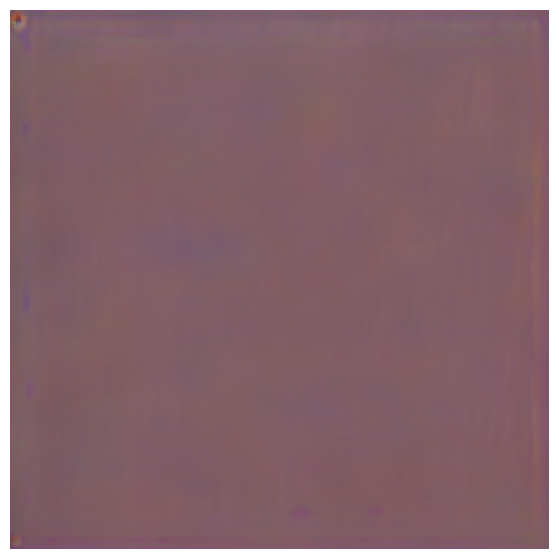

In [11]:
# 1) Augmentation is applied to the output image from generator #
# 2) Crop augmented image = goal is to increase the variation to be sent to CLIP, improving it understanding about this image #
augTransform = torch.nn.Sequential(
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomAffine(30, (.2, .2), fill=0)
).cuda()

Params, optimizer = init_params()

with torch.no_grad():
  print(Params().shape)
  img= norm_data(generator(Params()).cpu()) # 1 x 3 x 224 x 400 [225 x 400]
  print("img dimensions: ",img.shape)
  show_from_tensor(img[0])

## Cropping

In [12]:
def create_crops(img, num_crops=32):
  # Add padding to image = preserve image information, because we gonna apply some transformation to it #
  p = size1//2
  img = torch.nn.functional.pad(img, (p,p,p,p), mode='constant', value=0) # 1 x 3 x 448 x 624 (adding 112*2 on all sides to 224x400)

  # Augment the image #
  img = augTransform(img)

  # Get the crops #
  crop_set = []
  for ch in range(num_crops):
    gap1= int(torch.normal(1.2, .3, ()).clip(.43, 1.9) * size1)

    offsetx = torch.randint(0, int(size1*2-gap1),())
    offsety = torch.randint(0, int(size1*2-gap1),())

    # Crop image with random offsets #
    crop=img[:,:,offsetx:offsetx+gap1, offsety:offsety+gap1]

    # Adjust crop size to CLIP expected dim #
    crop = torch.nn.functional.interpolate(crop,(224,224), mode='bilinear', align_corners=True)
    crop_set.append(crop)

  # Stack all crops #
  img_crops=torch.cat(crop_set,0) ## 30 x 3 x 224 x 224

  # Add noise #
  randnormal = torch.randn_like(img_crops, requires_grad=False)
  num_rands=0
  randstotal=torch.rand((img_crops.shape[0],1,1,1)).cuda() #32

  for ns in range(num_rands):
    randstotal*=torch.rand((img_crops.shape[0],1,1,1)).cuda()

  img_crops = img_crops + noise_factor*randstotal*randnormal

  return img_crops

# Visualization function

In [13]:
def showme(Params, show_crop):
  with torch.no_grad():
    generated = generator(Params())

    if (show_crop):
      print("Augmented cropped example")
      aug_gen = generated.float()
      aug_gen = create_crops(aug_gen, num_crops=1)
      aug_gen_norm = norm_data(aug_gen[0])
      show_from_tensor(aug_gen_norm)

    print("Generation")
    latest_gen=norm_data(generated.cpu())
    show_from_tensor(latest_gen[0])

  return (latest_gen[0])

# Optimizing loop

In [14]:
def optimize_result(Params, prompt):
  # Adjusting prompts importance during optimizing #
  alpha = 1 # the importance of include prompts
  beta = 0.5 # the importance of exclude prompts

  ### Image ##
  # Get the image from VQGAN transformer (generator) #
  out = generator(Params())
  out = norm_data(out)

  # Augment and crop the images #
  out = create_crops(out)
  out = normalize(out) # 30 x 3 x 224 x 224

   # Enconde it (method from CLIP) #
  image_enc=clipmodel.encode_image(out) ## 30 x 512

  ### Text ###
  # Encoding #
  final_enc = w1*prompt + w1*extras_enc # prompt and extras_enc : 1 x 512
  final_text_include_enc = final_enc / final_enc.norm(dim=-1, keepdim=True) # 1 x 512
  final_text_exclude_enc = exclude_enc

  ### Loss Computation ###
  # Compute between include and extras text prompts and images #
  main_loss = torch.cosine_similarity(final_text_include_enc, image_enc, -1) # 30

  # Penalize loss come from exclude text prompt #
  penalize_loss = torch.cosine_similarity(final_text_exclude_enc, image_enc, -1) # 30

  # Final Loss #
  final_loss = -alpha*main_loss + beta*penalize_loss

  return final_loss

def optimize(Params, optimizer, prompt):
  loss = optimize_result(Params, prompt).mean()
  optimizer.zero_grad()
  loss.backward()
  optimizer.step()
  return loss

# Training Loop

In [15]:
def training_loop(Params, optimizer, show_crop=False):
  res_img=[]
  res_z=[]

  for prompt in include_enc:
    iteration=0

    # Initialize params #
    Params, optimizer = init_params() # 1 x 256 x 14 x 25 (225/16, 400/16)

    for it in range(total_iter):
      # Get loss and apply optimizing #
      loss = optimize(Params, optimizer, prompt)

      # Check results #
      if iteration>=80 and iteration%show_step == 0:
        new_img = showme(Params, show_crop)
        res_img.append(new_img)
        res_z.append(Params()) # 1 x 256 x 14 x 25
        print("loss:", loss.item(), "\niteration:",iteration)

      iteration+=1
    torch.cuda.empty_cache()
  return res_img, res_z

# Inputs Prompts and Parameters Setup

In [16]:
# Input Prompts #
include = ['sketch of a lady', 'sketch of a man on horse']
exclude = 'watermark, cropped, confusing, incoherent, cut, blurry'
extras = 'watercolor paper texture'

# Parameters Setup #
w1=1
w2=1
noise_factor= 0.22
total_iter=110
show_step=10 # Interval to show generated images

# Encode Prompts #
include_enc, exclude_enc, extras_enc = createEncodings(include, exclude, extras)


# Training

Augmented cropped example


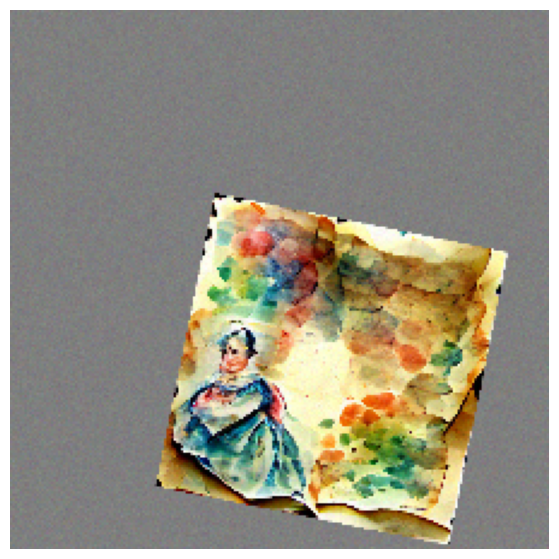

Generation


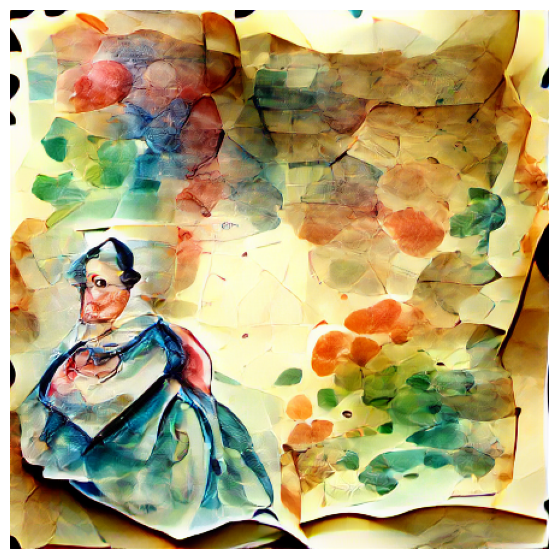

loss: -0.209716796875 
iteration: 80
Augmented cropped example


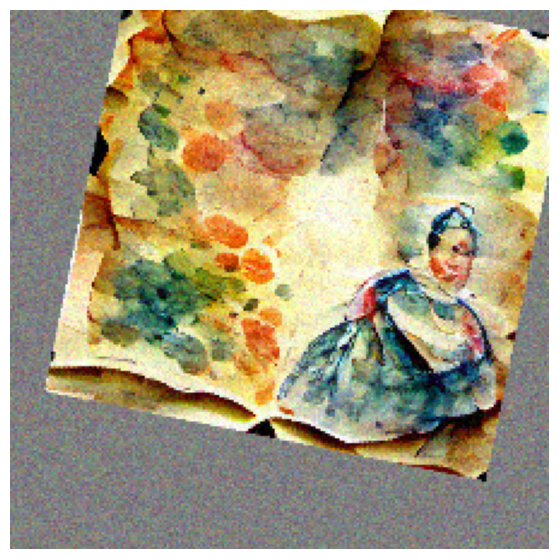

Generation


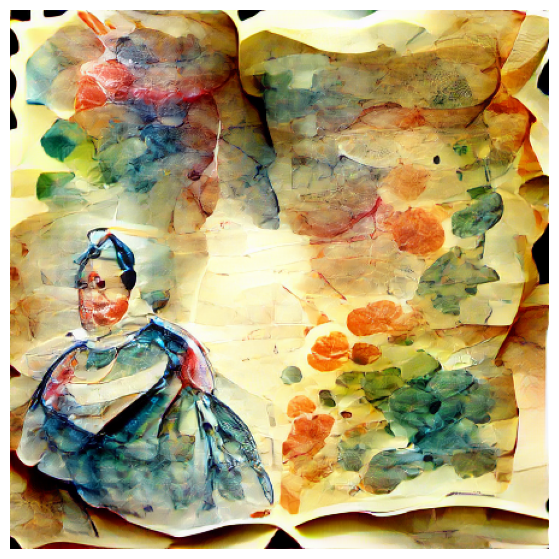

loss: -0.225830078125 
iteration: 90
Augmented cropped example


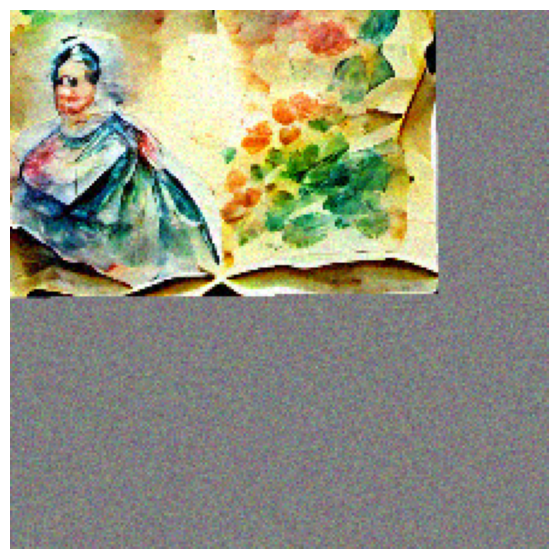

Generation


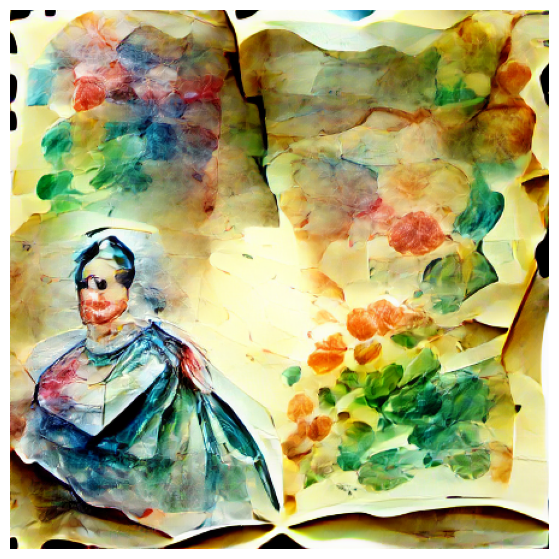

loss: -0.2054443359375 
iteration: 100
Augmented cropped example


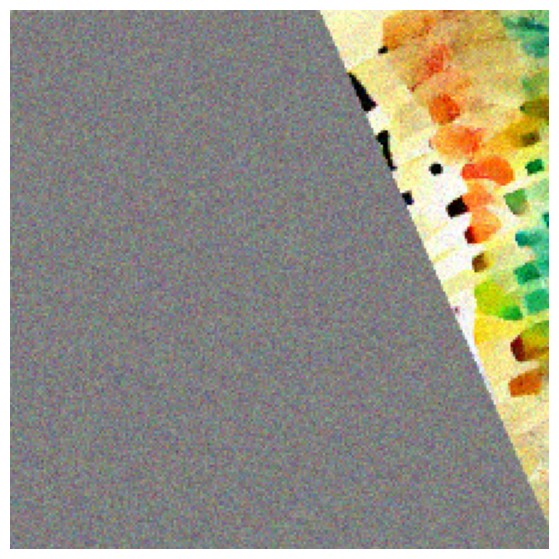

Generation


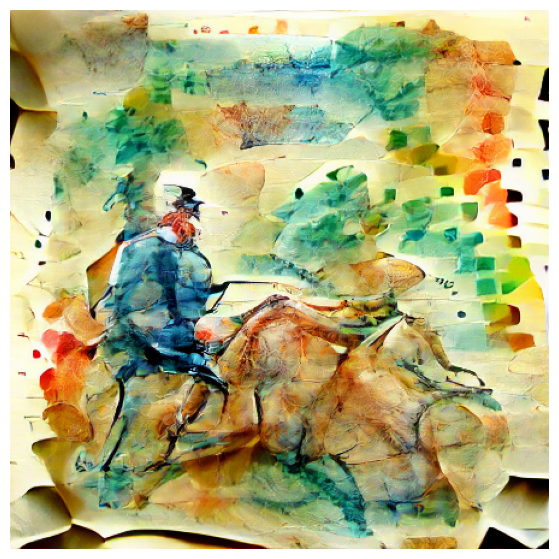

loss: -0.23974609375 
iteration: 80
Augmented cropped example


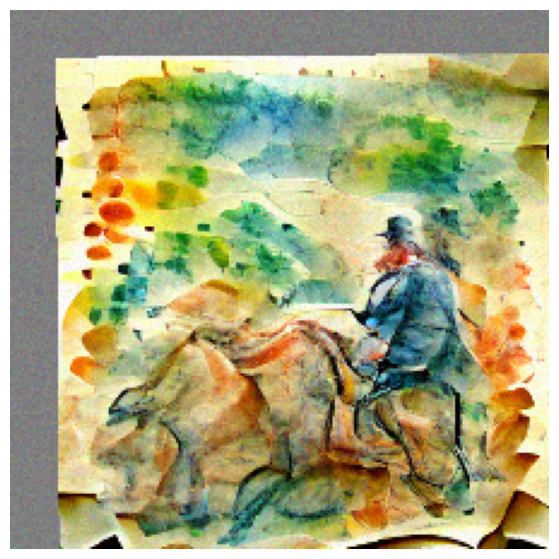

Generation


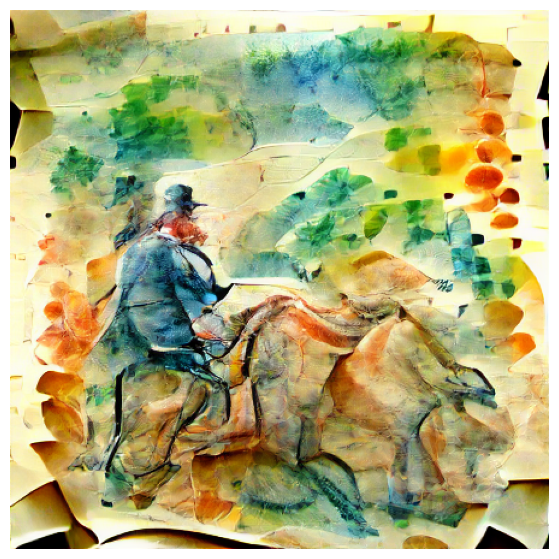

loss: -0.230712890625 
iteration: 90
Augmented cropped example


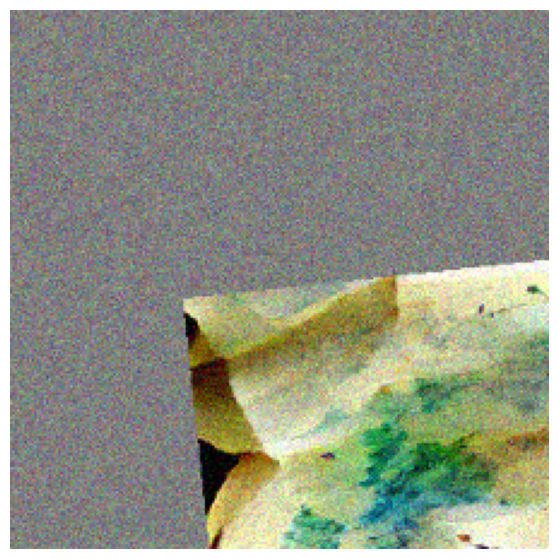

Generation


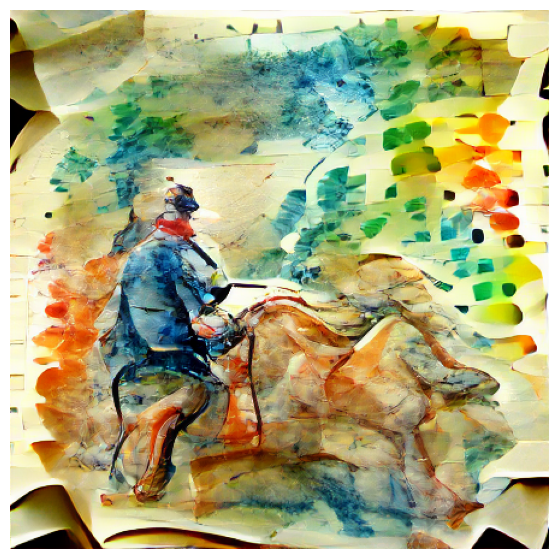

loss: -0.225341796875 
iteration: 100


In [17]:
# Clear cache #
torch.cuda.empty_cache()

# Run Training #
res_img, res_z=training_loop(Params, optimizer, show_crop=True)

# Checking Results

In [18]:
print(len(res_img), len(res_z))
print(res_img[0].shape, res_z[0].shape)
print(res_z[0].max(), res_z[0].min())
# These should be around +-5 and +-6

6 6
torch.Size([3, 448, 448]) torch.Size([1, 256, 28, 28])
tensor(6.3056, device='cuda:0', grad_fn=<MaxBackward1>) tensor(-5.9328, device='cuda:0', grad_fn=<MinBackward1>)


# Generating an interpolation

# Interpolation function

In [ ]:
def interpolate(res_z_list, duration_list):
  gen_img_list=[]
  fps = 25

  for idx, (z, duration) in enumerate(zip(res_z_list, duration_list)):
    num_steps = int(duration*fps)
    z1=z
    z2=res_z_list[(idx+1)%len(res_z_list)] # 1 x 256 x 14 x 25 (225/16, 400/16)

    for step in range(num_steps):
      alpha = math.sin(1.5*step/num_steps)**6 # Decrease displaying speed on middle samples, and increase on start and end
      z_new = alpha * z2 + (1-alpha) * z1

      new_gen=norm_data(generator(z_new).cpu())[0] ## 3 x 224 x 400
      new_img=T.ToPILImage(mode='RGB')(new_gen)
      gen_img_list.append(new_img)

  return gen_img_list

# Setup

Generation


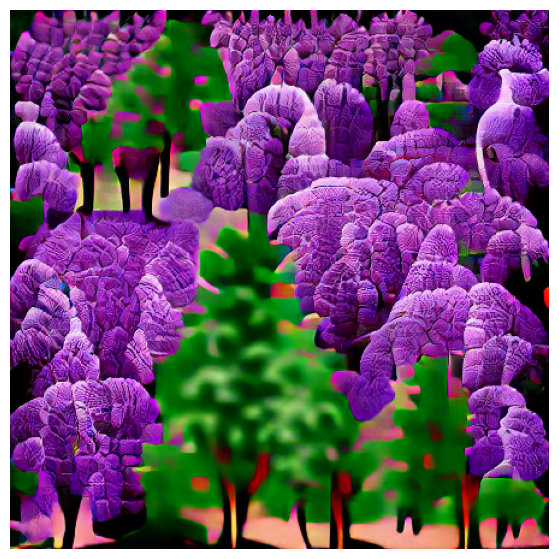

loss: -0.26953125 
iteration: 109
Generation


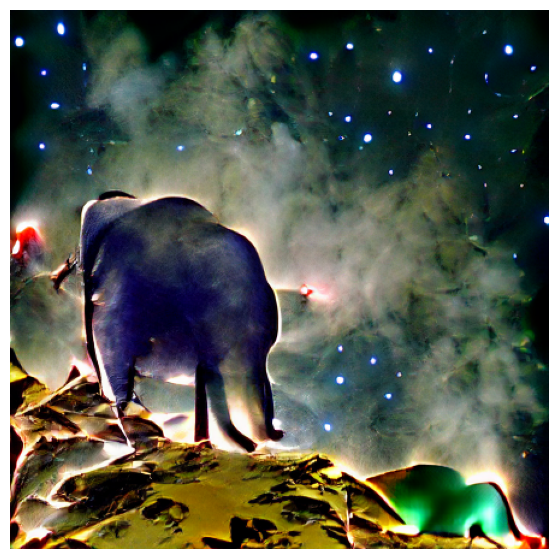

loss: -0.272216796875 
iteration: 109
Generation


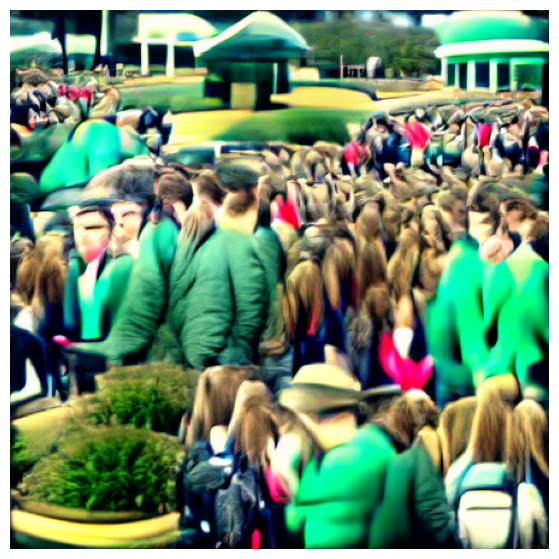

loss: -0.2890625 
iteration: 109


In [19]:
# Prompts #
include=['A forest with purple trees', 'an elephant at the top of a mountain, looking at the stars','one hundred people with green jackets']
exclude='watermark, cropped, confusing, incoherent, cut, blurry'
extras = ""

# Parameters #
w1=1
w2=1
noise_factor= .22
total_iter=110
show_step=total_iter-1 # set this if you want to interpolate between only the final versions
durations=[5,5,5,5,5,5] # Interpolation displaying durations

# Prompts enconding #
include_enc, exclude_enc, extras_enc = createEncodings(include, exclude, extras)

# Training #
torch.cuda.empty_cache()
res_img, res_z=training_loop(Params, optimizer, show_crop=False)

# Generate interpolation list #
interp_result_img_list = interpolate(res_z, durations)


# Interpolation function

In [20]:
def interpolate(res_z_list, duration_list):
  gen_img_list=[]
  fps = 25

  for idx, (z, duration) in enumerate(zip(res_z_list, duration_list)):
    num_steps = int(duration*fps)
    z1=z
    z2=res_z_list[(idx+1)%len(res_z_list)] # 1 x 256 x 14 x 25 (225/16, 400/16)

    for step in range(num_steps):
      alpha = math.sin(1.5*step/num_steps)**6 # Generate a 'slow' effect on the middle sample
      z_new = alpha * z2 + (1-alpha) * z1

      new_gen=norm_data(generator(z_new).cpu())[0] ## 3 x 224 x 400
      new_img=T.ToPILImage(mode='RGB')(new_gen)
      gen_img_list.append(new_img)

  return gen_img_list

# Displaying durations #
durations=[5,5,5,5,5,5]

interp_result_img_list = interpolate(res_z, durations)

# Generating interpolation video

In [21]:
out_video_path=f"../video.mp4"
writer = imageio.get_writer(out_video_path, fps=25)
for pil_img in interp_result_img_list:
  img = np.array(pil_img, dtype=np.uint8)
  writer.append_data(img)

writer.close()

In [22]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('../video.mp4','rb').read()
data="data:video/mp4;base64,"+b64encode(mp4).decode()
HTML("""<video width=800 controls><source src="%s" type="video/mp4"></video>""" % data)